In [1]:
import pandas as pd
import seaborn as sns
import glob
import matplotlib.pyplot as plt
import numpy as np

%load_ext lab_black

# check fragments

In [2]:
import os

In [3]:
bed_dict = {
    x.split("/")[-1].split(".frag")[0]: x
    for x in sorted(
        glob.glob(
            "../1_data_repository/fixedcells_fragments/*sorted.nearesttssdist.bed"
        )
    )
}
bed_dict

{'BIO_ddseq_1.FIXEDCELLS': '../1_data_repository/fixedcells_fragments/BIO_ddseq_1.FIXEDCELLS.fragments.sorted.nearesttssdist.bed',
 'BIO_ddseq_2.FIXEDCELLS': '../1_data_repository/fixedcells_fragments/BIO_ddseq_2.FIXEDCELLS.fragments.sorted.nearesttssdist.bed',
 'BIO_ddseq_3.FIXEDCELLS': '../1_data_repository/fixedcells_fragments/BIO_ddseq_3.FIXEDCELLS.fragments.sorted.nearesttssdist.bed',
 'BIO_ddseq_4.FIXEDCELLS': '../1_data_repository/fixedcells_fragments/BIO_ddseq_4.FIXEDCELLS.fragments.sorted.nearesttssdist.bed',
 'BRO_mtscatac_1.FIXEDCELLS': '../1_data_repository/fixedcells_fragments/BRO_mtscatac_1.FIXEDCELLS.fragments.sorted.nearesttssdist.bed',
 'BRO_mtscatac_2.FIXEDCELLS': '../1_data_repository/fixedcells_fragments/BRO_mtscatac_2.FIXEDCELLS.fragments.sorted.nearesttssdist.bed',
 'CNA_10xmultiome_1.FIXEDCELLS': '../1_data_repository/fixedcells_fragments/CNA_10xmultiome_1.FIXEDCELLS.fragments.sorted.nearesttssdist.bed',
 'CNA_10xmultiome_2.FIXEDCELLS': '../1_data_repository/fixe

In [4]:
import os

In [5]:
for sample, path in bed_dict.items():
    print(sample)
    if not os.path.exists(
        path.replace("nearesttssdist.bed", "nearesttssdist.subsampled.bed")
    ):
        df = pd.read_csv(path, sep="\t", header=None)
        df.columns = "frag_chrom frag_start frag_end frag_index tss_chrom tss_start tss_end gene score strand tss_dist".split()
        df = df.drop_duplicates(subset=["frag_chrom", "frag_start", "frag_end"])
        df["frag_length"] = df["frag_end"] - df["frag_start"]

        df = df.sample(n=500000)
        df.to_csv(
            path.replace("nearesttssdist.bed", "nearesttssdist.subsampled.bed"),
            sep="\t",
        )
    else:
        df = pd.read_csv(
            path.replace("nearesttssdist.bed", "nearesttssdist.subsampled.bed"),
            sep="\t",
            header=0,
        )
        df = df.sample(n=500000)
        df = df[["frag_length", "tss_dist"]]
        df.columns = ["x", "y"]
        df["y"] = df["y"] + 1  # replace 0 by 1
        df["y"] = np.log10(df["y"])
        df.to_csv(f"tss_dist/{sample}__frag_length_tss_dist.tsv", sep="\t", index=False)

BIO_ddseq_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


BIO_ddseq_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


BIO_ddseq_3.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


BIO_ddseq_4.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


BRO_mtscatac_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


BRO_mtscatac_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


CNA_10xmultiome_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


CNA_10xmultiome_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


CNA_10xv11_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


CNA_10xv11_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


CNA_10xv11_3.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


CNA_10xv11_4.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


CNA_10xv11_5.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


CNA_10xv2_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


CNA_10xv2_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


CNA_hydrop_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


CNA_hydrop_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


CNA_hydrop_3.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


CNA_mtscatac_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


CNA_mtscatac_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


EPF_hydrop_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


EPF_hydrop_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


EPF_hydrop_3.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


EPF_hydrop_4.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


HAR_ddseq_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


HAR_ddseq_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


MDC_mtscatac_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


MDC_mtscatac_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


OHS_s3atac_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


OHS_s3atac_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


SAN_10xmultiome_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


SAN_10xmultiome_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


STA_10xv11_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


STA_10xv11_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


TXG_10xv11_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


TXG_10xv2_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


TXG_10xv2_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


UCS_ddseq_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


UCS_ddseq_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


VIB_10xmultiome_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


VIB_10xmultiome_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


VIB_10xv1_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


VIB_10xv1_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


VIB_10xv2_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


VIB_10xv2_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


VIB_hydrop_1.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


VIB_hydrop_11.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


VIB_hydrop_12.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


VIB_hydrop_2.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


VIB_hydrop_21.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


VIB_hydrop_22.FIXEDCELLS


/opt/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [6]:
# for sample, path in bed_dict.items():
#     print(sample)


#     df = pd.read_csv(
#         path.replace("nearesttssdist.bed", "nearesttssdist.subsampled.bed"),
#         sep="\t",
#         header=0,
#     )
#     df = df.sample(n=500000)
#     df = df[["frag_length", "tss_dist"]]
#     df.columns = ["x", "y"]
#     df["y"] = df["y"] + 1  # replace 0 by 1
#     df["y"] = np.log10(df["y"])
#     df.to_csv(f"tss_dist/{sample}__frag_length_tss_dist.tsv", sep="\t", index=False)

# now calculate KDE

In [ ]:
cat /lustre1/project/stg_00090/scatac_benchmark/0_resources/scripts/multiprocess_kde.py

In [41]:
# then, in bash:

```
for infile in tss_dist/*tss_dist.tsv
do
    echo $infile
    singularity exec -B /lustre1,/staging,/data,/vsc-hard-mounts,/scratch ../0_resources/cistopic_image/20220815_pycistopic.sif python /lustre1/project/stg_00090/scatac_benchmark/0_resources/scripts/multiprocess_kde.py -i $infile -o ${infile%tss_dist.tsv}tss_dist_kde.tsv -n 16
done
```

# plot

In [5]:
path_dict = {
    x.split("/")[-1].split("__")[0]: x for x in sorted(glob.glob("tss_dist/*chr19*tsv"))
}
path_dict

{'BIO_ddseq_1.FIXEDCELLS': 'tss_dist/BIO_ddseq_1.FIXEDCELLS__frag_length_tss_dist_kde.chr19.tsv',
 'BIO_ddseq_2.FIXEDCELLS': 'tss_dist/BIO_ddseq_2.FIXEDCELLS__frag_length_tss_dist_kde.chr19.tsv',
 'BIO_ddseq_3.FIXEDCELLS': 'tss_dist/BIO_ddseq_3.FIXEDCELLS__frag_length_tss_dist_kde.chr19.tsv',
 'BIO_ddseq_4.FIXEDCELLS': 'tss_dist/BIO_ddseq_4.FIXEDCELLS__frag_length_tss_dist_kde.chr19.tsv',
 'BRO_mtscatac_1.FIXEDCELLS': 'tss_dist/BRO_mtscatac_1.FIXEDCELLS__frag_length_tss_dist_kde.chr19.tsv',
 'BRO_mtscatac_2.FIXEDCELLS': 'tss_dist/BRO_mtscatac_2.FIXEDCELLS__frag_length_tss_dist_kde.chr19.tsv',
 'CNA_10xmultiome_1.FIXEDCELLS': 'tss_dist/CNA_10xmultiome_1.FIXEDCELLS__frag_length_tss_dist_kde.chr19.tsv',
 'CNA_10xmultiome_2.FIXEDCELLS': 'tss_dist/CNA_10xmultiome_2.FIXEDCELLS__frag_length_tss_dist_kde.chr19.tsv',
 'CNA_10xv11_1.FIXEDCELLS': 'tss_dist/CNA_10xv11_1.FIXEDCELLS__frag_length_tss_dist_kde.chr19.tsv',
 'CNA_10xv11_2.FIXEDCELLS': 'tss_dist/CNA_10xv11_2.FIXEDCELLS__frag_length_tss_d

In [6]:
df_merged = pd.DataFrame()
df_all_merged = pd.DataFrame()
for sample, path in path_dict.items():
    print(sample)
    df = pd.read_csv(path, index_col=None, header=0, sep="\t")

    df["length"] = "nucleosome-free"
    df.loc[df["x"] > 147, "length"] = "mononucleosomal"
    df.loc[df["x"] > 294, "length"] = "multinucleosomal"

    df["distance"] = "proximal"
    df.loc[df["y"] > np.log10(1000), "distance"] = "distal"

    df["quantile"] = df["length"] + "_" + df["distance"]
    df_quants = pd.DataFrame(df["quantile"].value_counts())
    df_quants.columns = [sample]
    df_merged = pd.concat([df_merged, df_quants], axis=1)
    df["sample"] = sample
    df_all_merged = pd.concat([df_all_merged, df], axis=0)

BIO_ddseq_1.FIXEDCELLS
BIO_ddseq_2.FIXEDCELLS
BIO_ddseq_3.FIXEDCELLS
BIO_ddseq_4.FIXEDCELLS
BRO_mtscatac_1.FIXEDCELLS
BRO_mtscatac_2.FIXEDCELLS
CNA_10xmultiome_1.FIXEDCELLS
CNA_10xmultiome_2.FIXEDCELLS
CNA_10xv11_1.FIXEDCELLS
CNA_10xv11_2.FIXEDCELLS
CNA_10xv11_3.FIXEDCELLS
CNA_10xv11_4.FIXEDCELLS
CNA_10xv11_5.FIXEDCELLS
CNA_10xv2_1.FIXEDCELLS
CNA_10xv2_2.FIXEDCELLS
CNA_hydrop_1.FIXEDCELLS
CNA_hydrop_2.FIXEDCELLS
CNA_hydrop_3.FIXEDCELLS
CNA_mtscatac_1.FIXEDCELLS
CNA_mtscatac_2.FIXEDCELLS
EPF_hydrop_1.FIXEDCELLS
EPF_hydrop_2.FIXEDCELLS
EPF_hydrop_3.FIXEDCELLS
EPF_hydrop_4.FIXEDCELLS
HAR_ddseq_1.FIXEDCELLS
HAR_ddseq_2.FIXEDCELLS
MDC_mtscatac_1.FIXEDCELLS
MDC_mtscatac_2.FIXEDCELLS
OHS_s3atac_1.FIXEDCELLS
OHS_s3atac_2.FIXEDCELLS
SAN_10xmultiome_1.FIXEDCELLS
SAN_10xmultiome_2.FIXEDCELLS
STA_10xv11_1.FIXEDCELLS
STA_10xv11_2.FIXEDCELLS
TXG_10xv11_1.FIXEDCELLS
TXG_10xv2_1.FIXEDCELLS
TXG_10xv2_2.FIXEDCELLS
UCS_ddseq_1.FIXEDCELLS
UCS_ddseq_2.FIXEDCELLS
VIB_10xmultiome_1.FIXEDCELLS
VIB_10xmultiome

In [18]:
df_merged_normalized = df_merged.T / 200000

In [21]:
df_merged_normalized

,nucleosome-free_proximal,mononucleosomal_distal,mononucleosomal_proximal,nucleosome-free_distal,multinucleosomal_distal,multinucleosomal_proximal
BIO_ddseq_1.FIXEDCELLS,0.255515,0.248135,0.220250,0.127250,0.074700,0.074150
BIO_ddseq_2.FIXEDCELLS,0.281615,0.192165,0.233715,0.134655,0.075550,0.082300
BIO_ddseq_3.FIXEDCELLS,0.352085,0.153485,0.194645,0.203455,0.042235,0.054095
BIO_ddseq_4.FIXEDCELLS,0.354870,0.153100,0.193885,0.203835,0.041310,0.053000
BRO_mtscatac_1.FIXEDCELLS,0.334110,0.167075,0.173855,0.227760,0.046160,0.051040
BRO_mtscatac_2.FIXEDCELLS,0.341345,0.166895,0.173240,0.226265,0.044270,0.047985
CNA_10xmultiome_1.FIXEDCELLS,0.297725,0.201440,0.139160,0.225390,0.077245,0.059040
CNA_10xmultiome_2.FIXEDCELLS,0.283755,0.222610,0.128990,0.240330,0.073180,0.051135
CNA_10xv11_1.FIXEDCELLS,0.301795,0.210765,0.103135,0.273525,0.071325,0.039455
CNA_10xv11_2.FIXEDCELLS,0.309450,0.210295,0.101035,0.273765,0.067640,0.037815


In [45]:
df_merged_normalized["nucleosome-free"] = df_merged_normalized[
    ["nucleosome-free_proximal", "nucleosome-free_distal"]
].sum(axis=1)
df_merged_normalized["mononucleosomal"] = df_merged_normalized[
    ["mononucleosomal_distal", "mononucleosomal_proximal"]
].sum(axis=1)
df_merged_normalized["multinucleosomal"] = df_merged_normalized[
    ["multinucleosomal_distal", "multinucleosomal_proximal"]
].sum(axis=1)
df_merged_normalized["proximal"] = df_merged_normalized[
    [
        "nucleosome-free_proximal",
        "mononucleosomal_proximal",
        "multinucleosomal_proximal",
    ]
].sum(axis=1)
df_merged_normalized["distal"] = df_merged_normalized[
    ["mononucleosomal_distal", "nucleosome-free_distal", "multinucleosomal_distal"]
].sum(axis=1)
df_merged_normalized.to_csv(
    "median_frag_len_median_tss_dist_quantiles.tsv", header=True, index=True, sep="\t"
)

In [25]:
order = [
    "VIB_10xv1_1.FIXEDCELLS",
    "VIB_10xv1_2.FIXEDCELLS",
    "TXG_10xv11_1.FIXEDCELLS",
    "CNA_10xv11_3.FIXEDCELLS",
    "CNA_10xv11_2.FIXEDCELLS",
    "CNA_10xv11_1.FIXEDCELLS",
    "STA_10xv11_1.FIXEDCELLS",
    "STA_10xv11_2.FIXEDCELLS",
    "CNA_10xv11_4.FIXEDCELLS",
    "CNA_10xv11_5.FIXEDCELLS",
    "VIB_10xv2_2.FIXEDCELLS",
    "VIB_10xv2_1.FIXEDCELLS",
    "TXG_10xv2_1.FIXEDCELLS",
    "TXG_10xv2_2.FIXEDCELLS",
    "CNA_10xv2_1.FIXEDCELLS",
    "CNA_10xv2_2.FIXEDCELLS",
    "SAN_10xmultiome_1.FIXEDCELLS",
    "SAN_10xmultiome_2.FIXEDCELLS",
    "CNA_10xmultiome_1.FIXEDCELLS",
    "CNA_10xmultiome_2.FIXEDCELLS",
    "VIB_10xmultiome_2.FIXEDCELLS",
    "VIB_10xmultiome_1.FIXEDCELLS",
    "MDC_mtscatac_1.FIXEDCELLS",
    "MDC_mtscatac_2.FIXEDCELLS",
    "CNA_mtscatac_2.FIXEDCELLS",
    "CNA_mtscatac_1.FIXEDCELLS",
    "BRO_mtscatac_1.FIXEDCELLS",
    "BRO_mtscatac_2.FIXEDCELLS",
    "HAR_ddseq_1.FIXEDCELLS",
    "HAR_ddseq_2.FIXEDCELLS",
    "BIO_ddseq_2.FIXEDCELLS",
    "BIO_ddseq_4.FIXEDCELLS",
    "BIO_ddseq_1.FIXEDCELLS",
    "BIO_ddseq_3.FIXEDCELLS",
    "UCS_ddseq_2.FIXEDCELLS",
    "UCS_ddseq_1.FIXEDCELLS",
    "OHS_s3atac_1.FIXEDCELLS",
    "OHS_s3atac_2.FIXEDCELLS",
    "EPF_hydrop_4.FIXEDCELLS",
    "EPF_hydrop_3.FIXEDCELLS",
    "EPF_hydrop_1.FIXEDCELLS",
    "EPF_hydrop_2.FIXEDCELLS",
    "VIB_hydrop_2.FIXEDCELLS",
    "VIB_hydrop_1.FIXEDCELLS",
    "CNA_hydrop_3.FIXEDCELLS",
    "CNA_hydrop_1.FIXEDCELLS",
    "CNA_hydrop_2.FIXEDCELLS",
]

<AxesSubplot: >

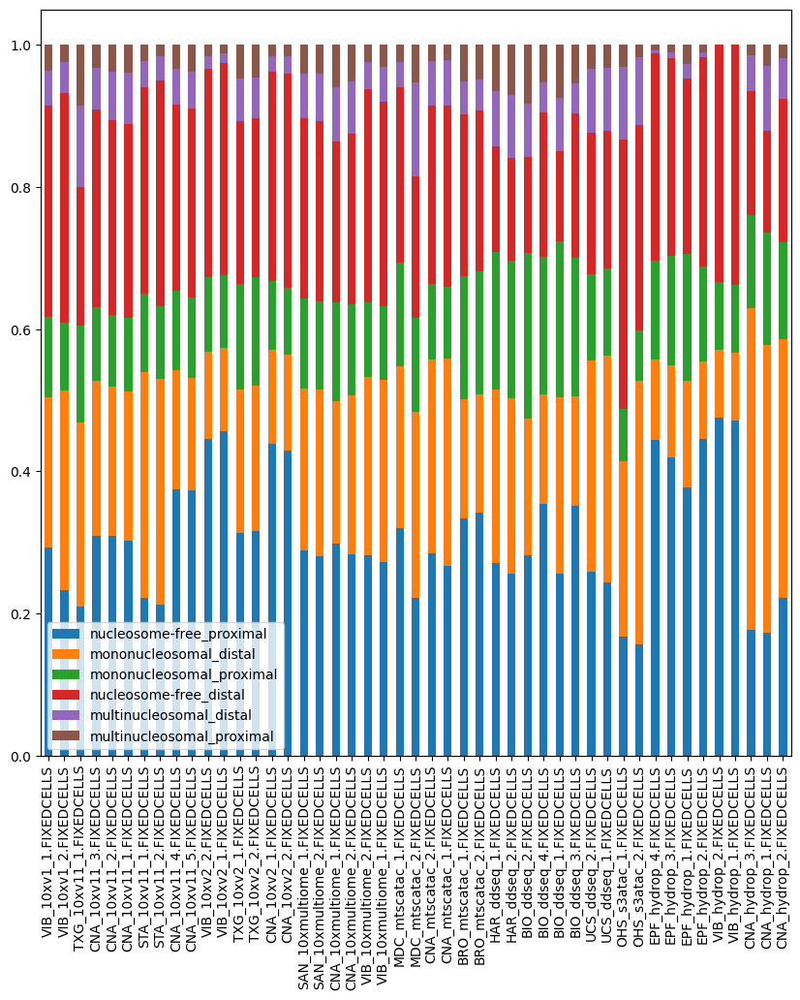

In [27]:
fig, ax = plt.subplots(figsize=(10, 10))
df_merged_normalized.loc[order].plot.bar(stacked=True, ax=ax)

# plot scatters

In [10]:
df_merged_normalized_stacked = df_merged_normalized.stack().reset_index()

In [11]:
df_merged_normalized_stacked.to_csv(
    "tss_dist_normalized_stacked.tsv", sep="\t", index=False, header=None
)

In [12]:
df_merged_normalized.to_csv(
    "tss_dist_normalized.tsv", sep="\t", index=True, header=True
)

BIO_ddseq_1.FIXEDCELLS


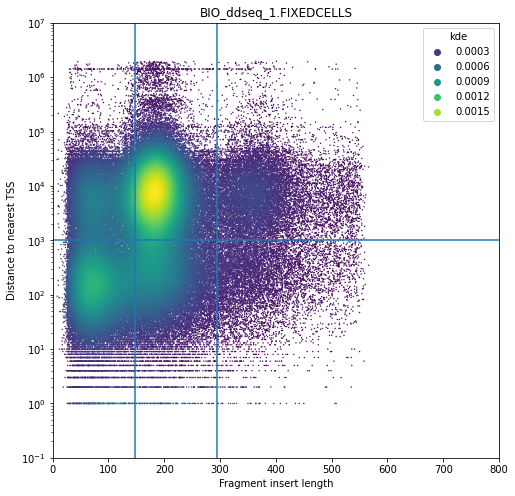

BIO_ddseq_2.FIXEDCELLS


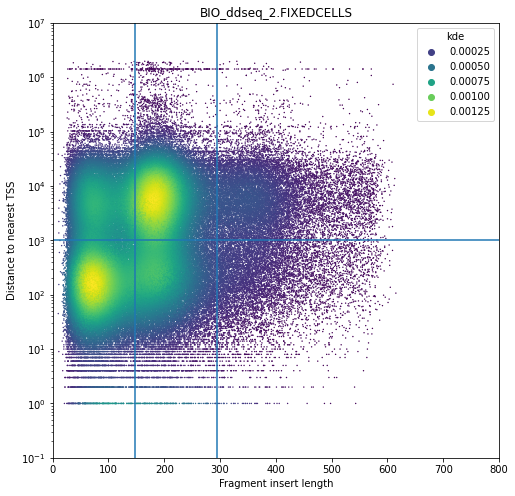

BIO_ddseq_3.FIXEDCELLS


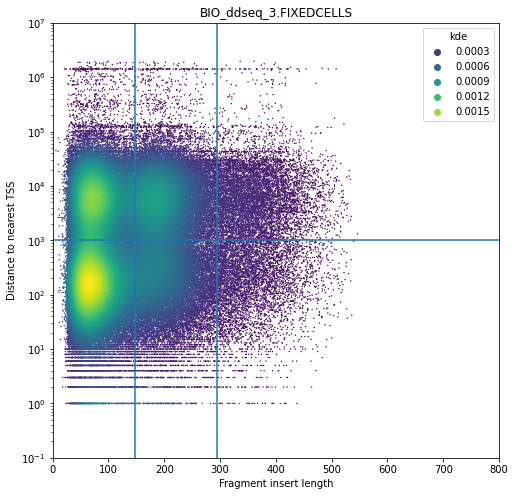

BIO_ddseq_4.FIXEDCELLS


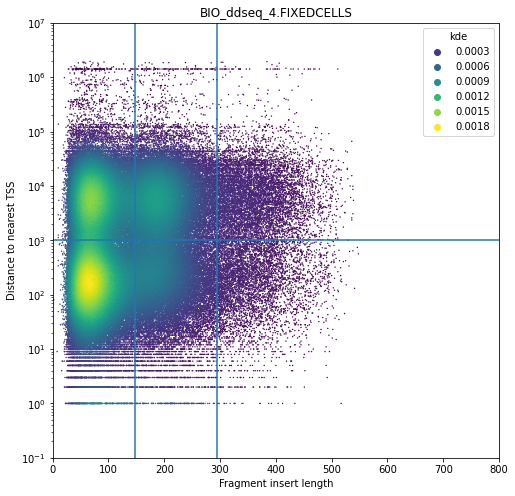

BRO_mtscatac_1.FIXEDCELLS


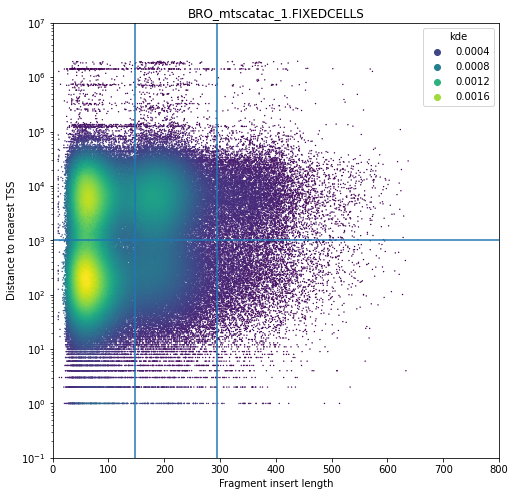

BRO_mtscatac_2.FIXEDCELLS


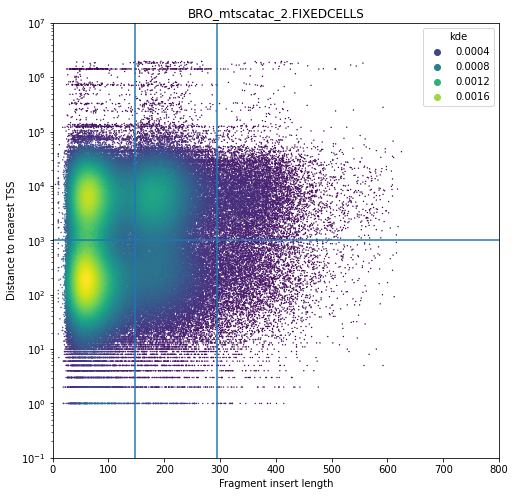

CNA_10xmultiome_1.FIXEDCELLS


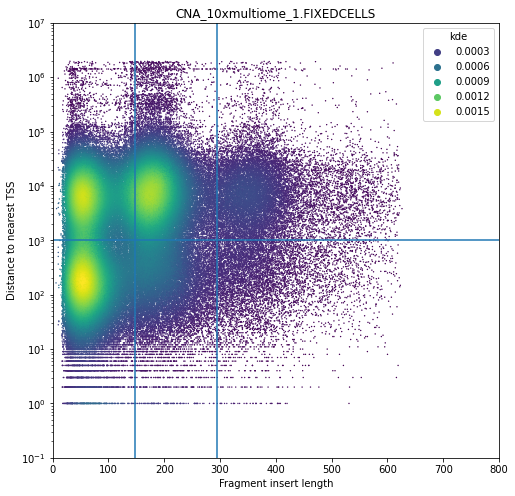

CNA_10xmultiome_2.FIXEDCELLS


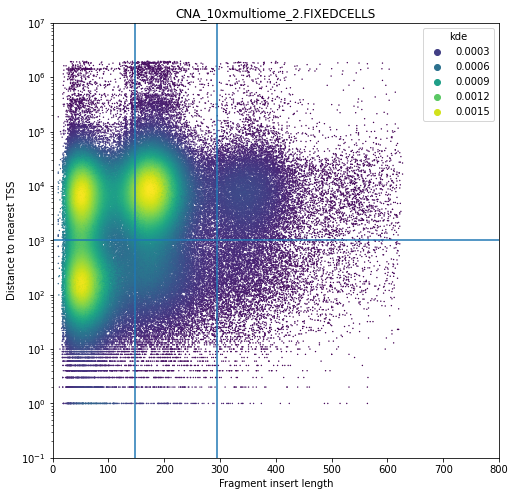

CNA_10xv11_1.FIXEDCELLS


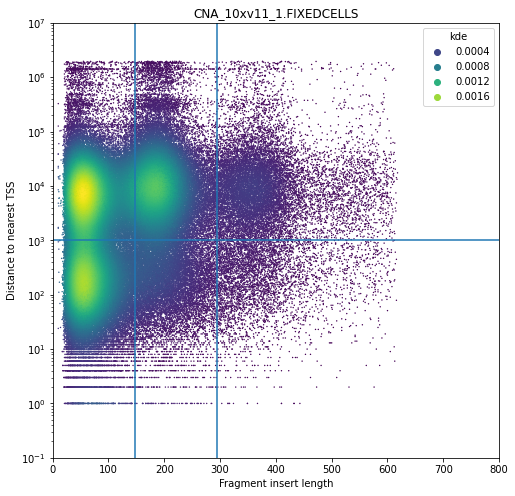

CNA_10xv11_2.FIXEDCELLS


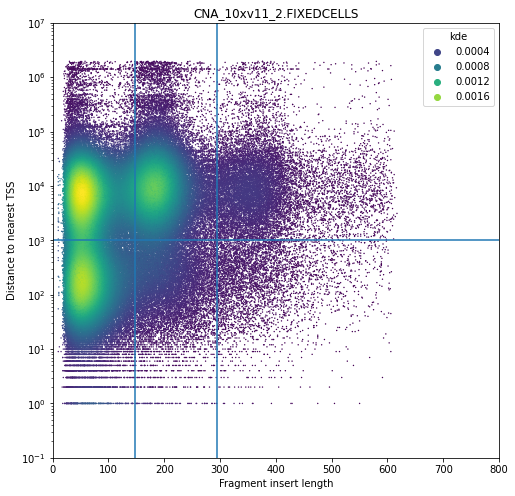

CNA_10xv11_3.FIXEDCELLS


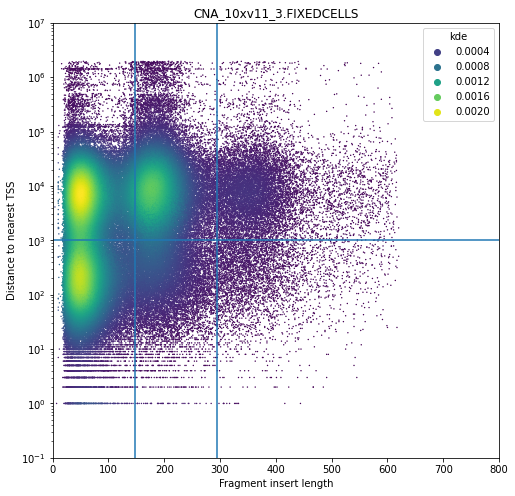

CNA_10xv11_4.FIXEDCELLS


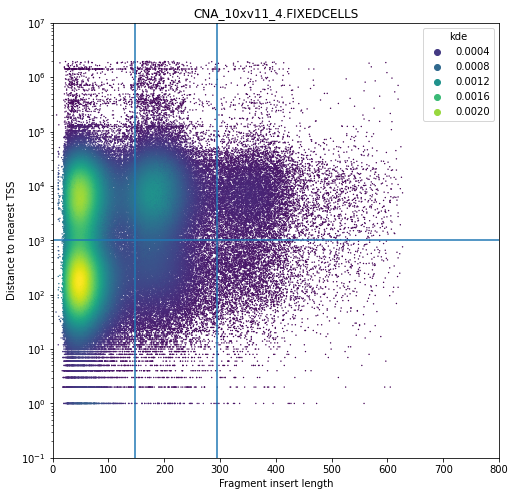

CNA_10xv11_5.FIXEDCELLS


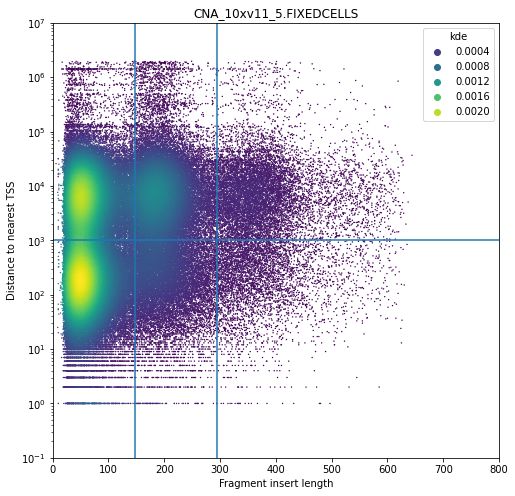

CNA_10xv2_1.FIXEDCELLS


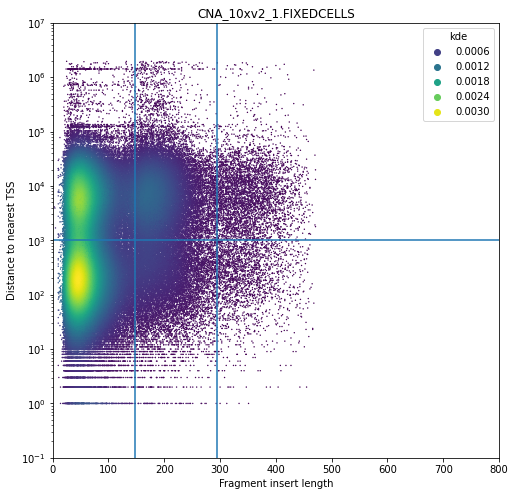

CNA_10xv2_2.FIXEDCELLS


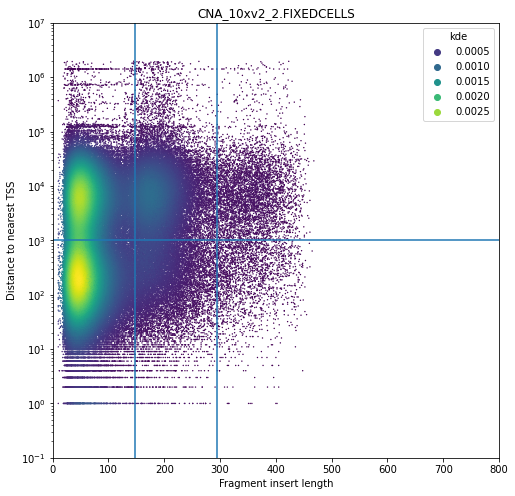

CNA_hydrop_1.FIXEDCELLS


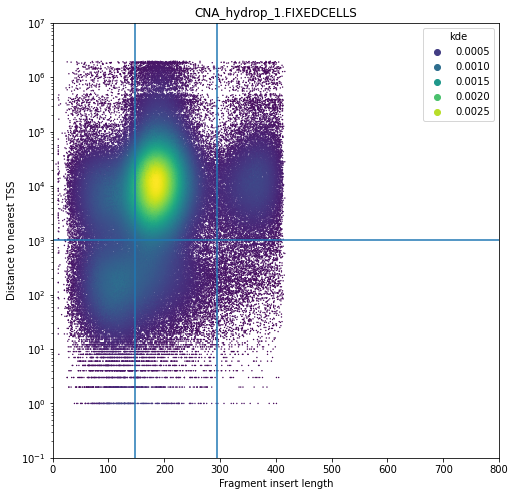

CNA_hydrop_2.FIXEDCELLS


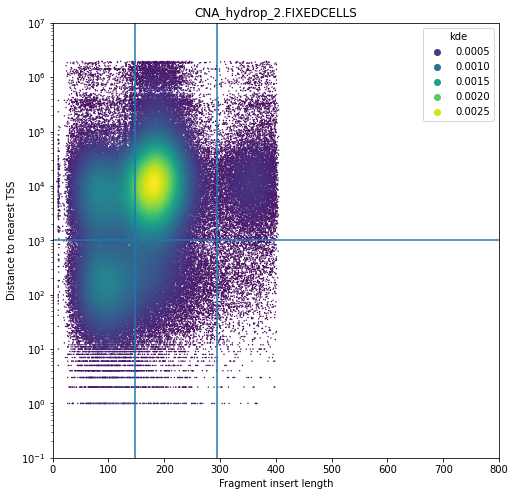

CNA_hydrop_3.FIXEDCELLS


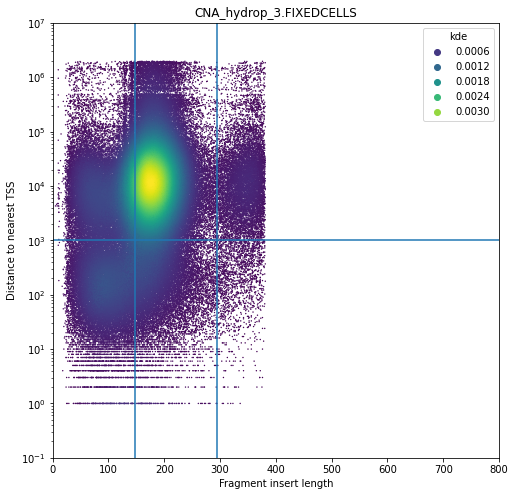

CNA_mtscatac_1.FIXEDCELLS


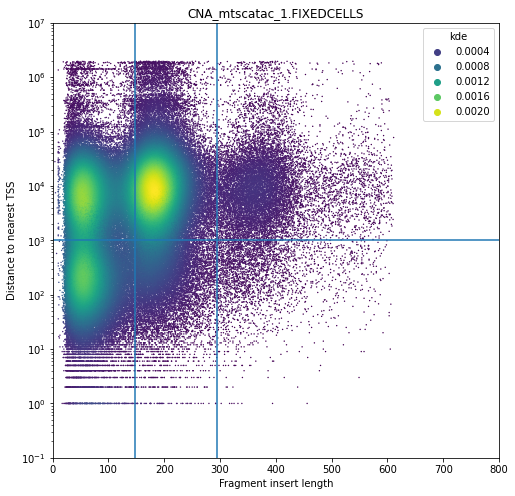

CNA_mtscatac_2.FIXEDCELLS


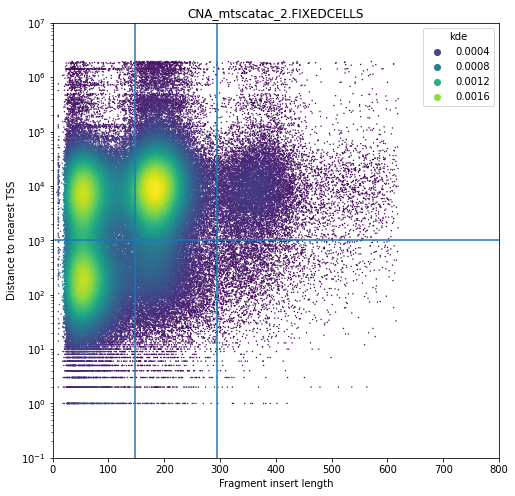

EPF_hydrop_1.FIXEDCELLS


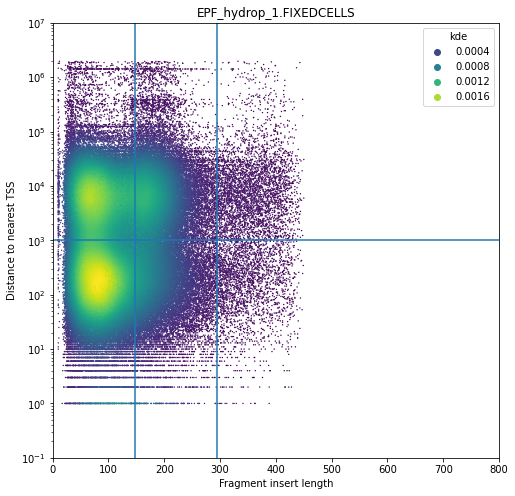

EPF_hydrop_2.FIXEDCELLS


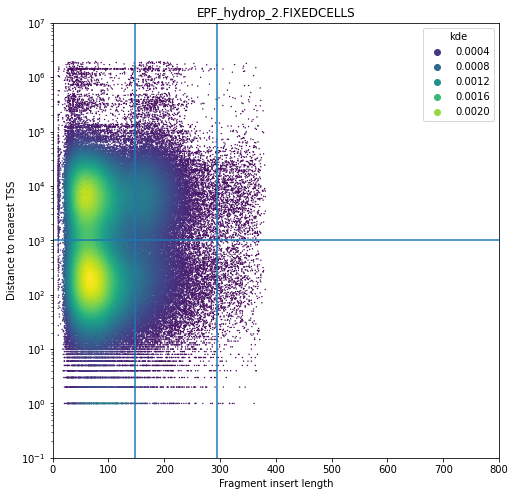

EPF_hydrop_3.FIXEDCELLS


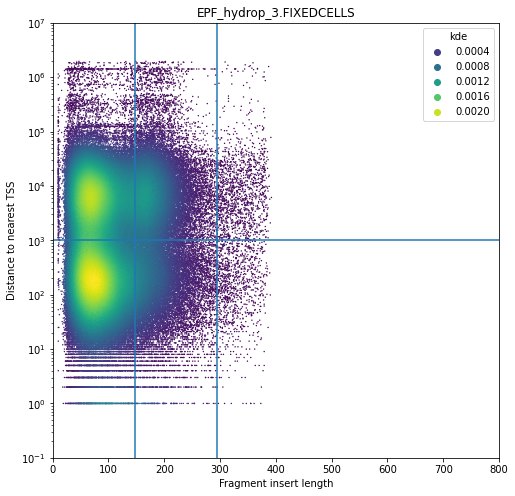

EPF_hydrop_4.FIXEDCELLS


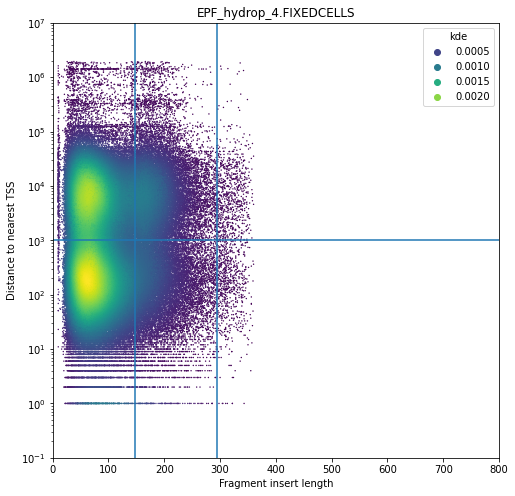

HAR_ddseq_1.FIXEDCELLS


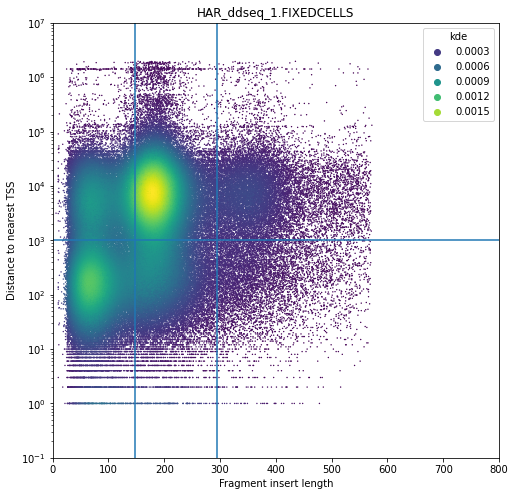

HAR_ddseq_2.FIXEDCELLS


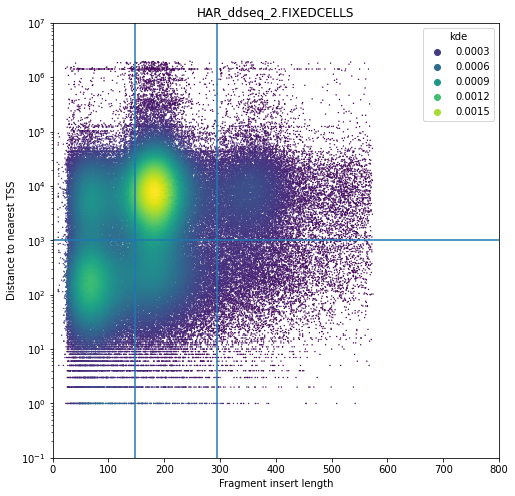

MDC_mtscatac_1.FIXEDCELLS


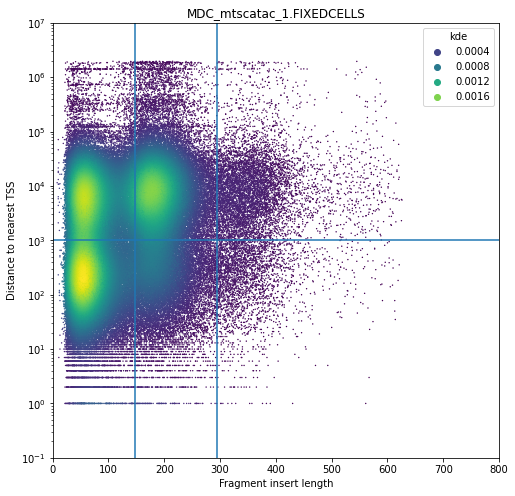

MDC_mtscatac_2.FIXEDCELLS


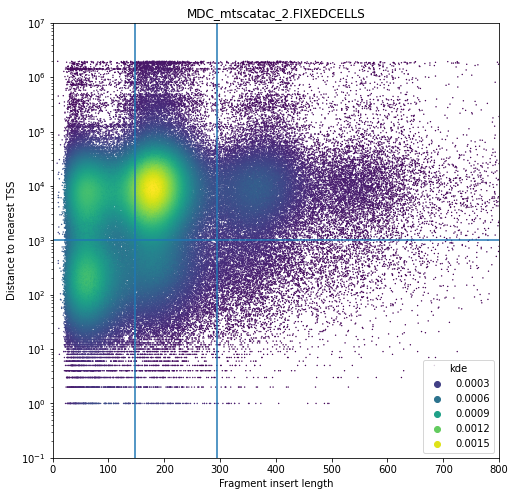

OHS_s3atac_1.FIXEDCELLS


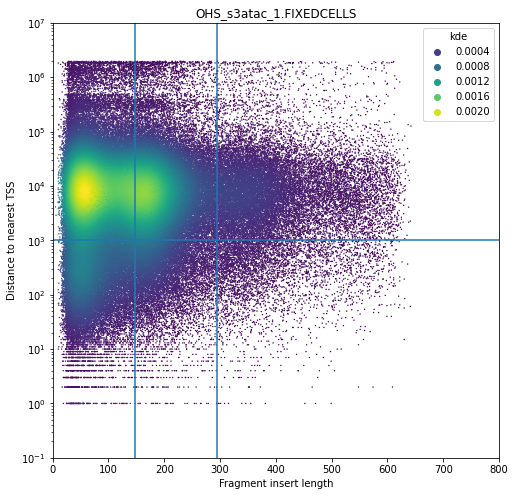

OHS_s3atac_2.FIXEDCELLS


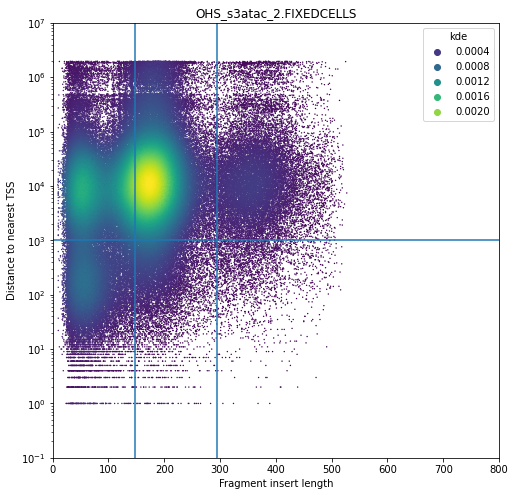

SAN_10xmultiome_1.FIXEDCELLS


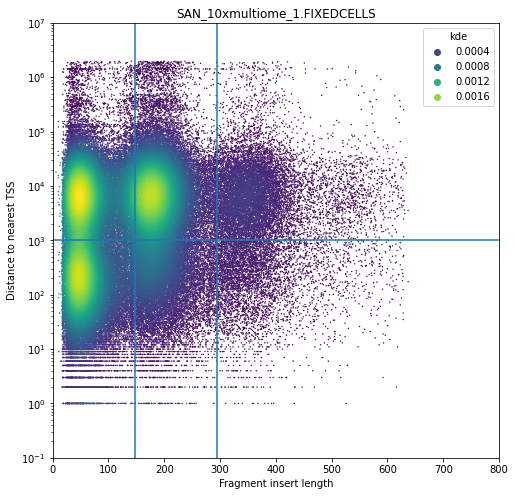

SAN_10xmultiome_2.FIXEDCELLS


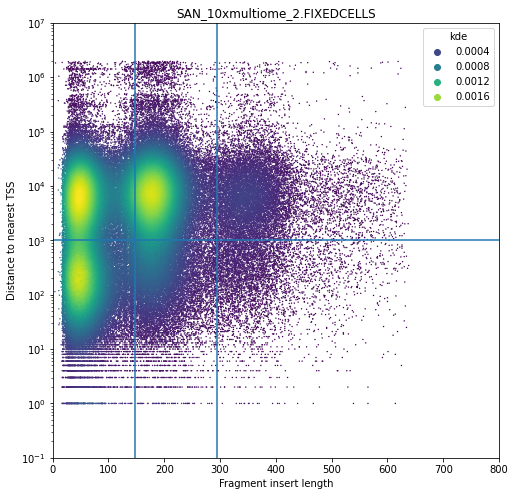

STA_10xv11_1.FIXEDCELLS


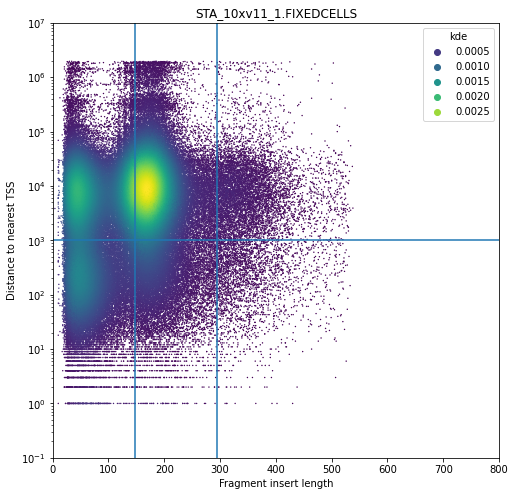

STA_10xv11_2.FIXEDCELLS


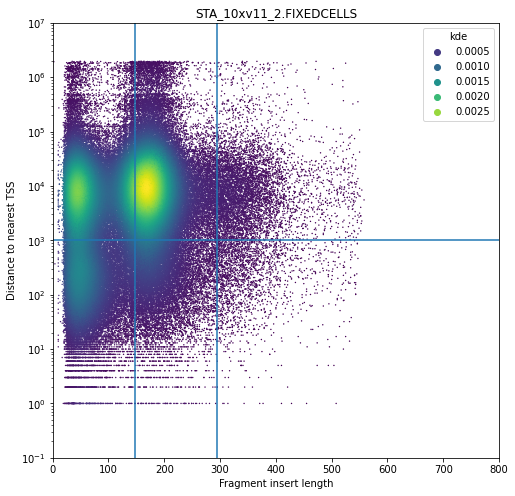

TXG_10xv11_1.FIXEDCELLS


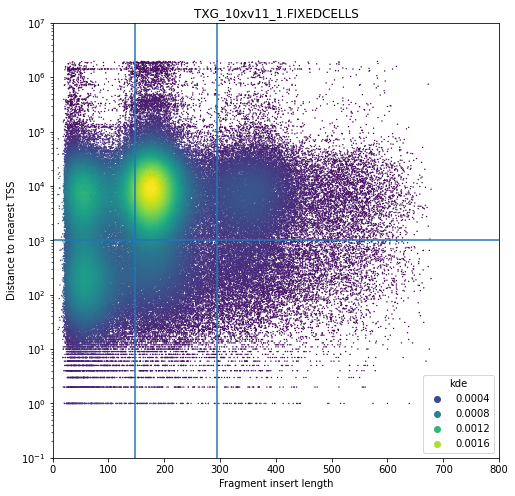

TXG_10xv2_1.FIXEDCELLS


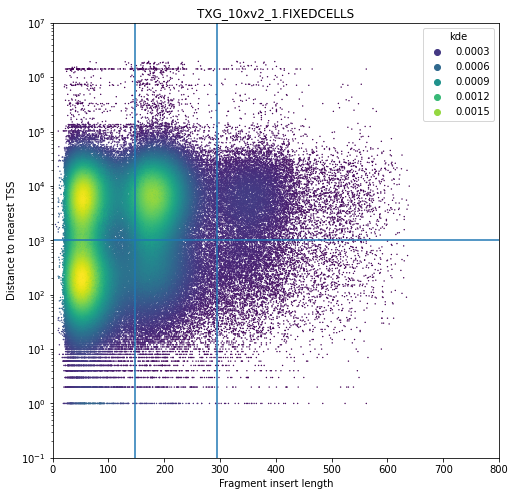

TXG_10xv2_2.FIXEDCELLS


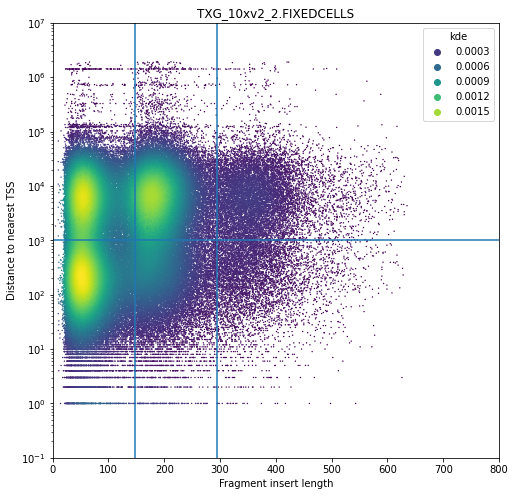

UCS_ddseq_1.FIXEDCELLS


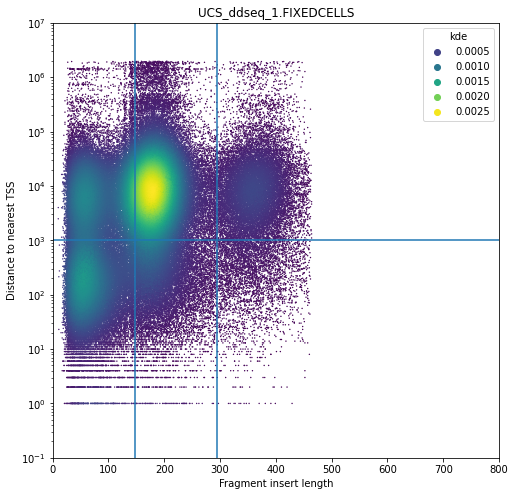

UCS_ddseq_2.FIXEDCELLS


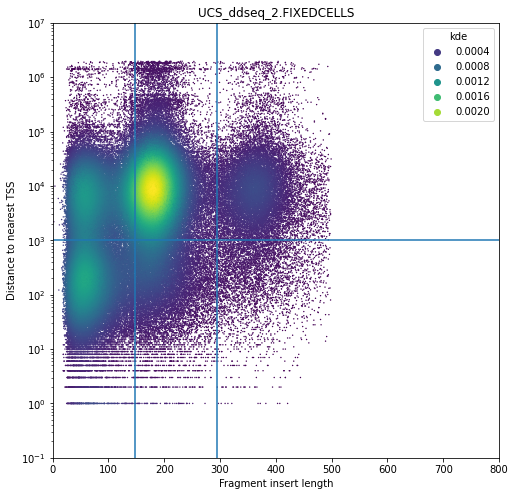

VIB_10xmultiome_1.FIXEDCELLS


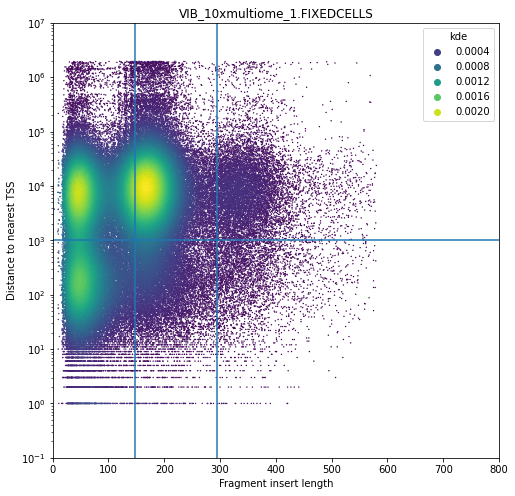

VIB_10xmultiome_2.FIXEDCELLS


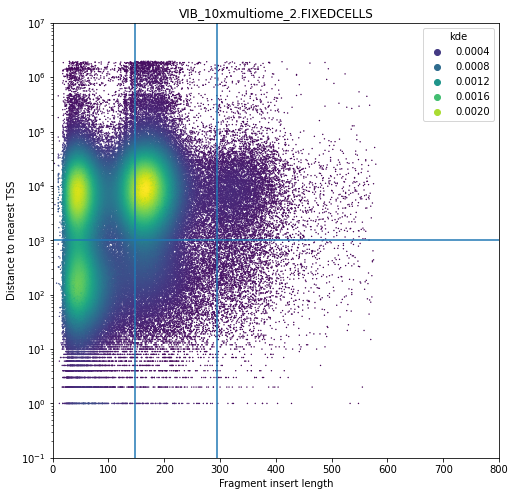

VIB_10xv1_1.FIXEDCELLS


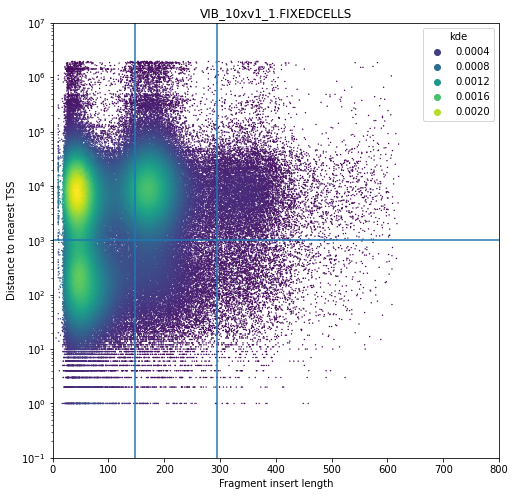

VIB_10xv1_2.FIXEDCELLS


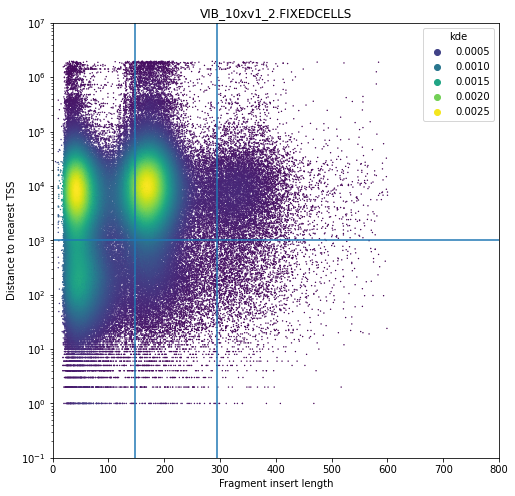

VIB_10xv2_1.FIXEDCELLS


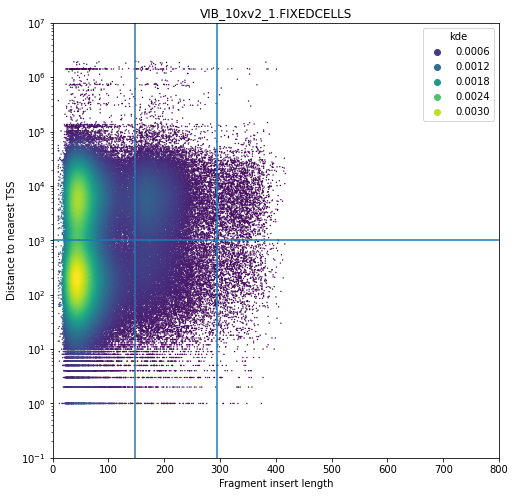

VIB_10xv2_2.FIXEDCELLS


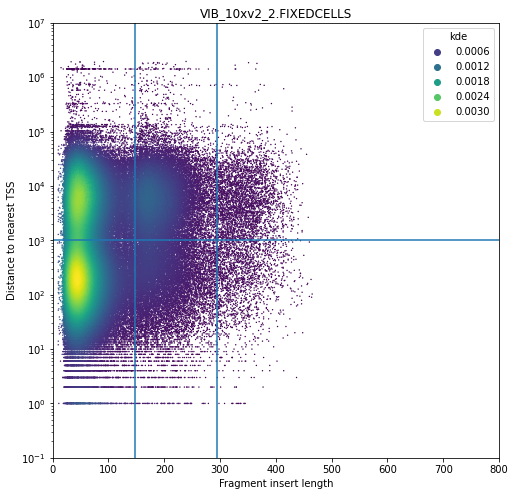

VIB_hydrop_1.FIXEDCELLS


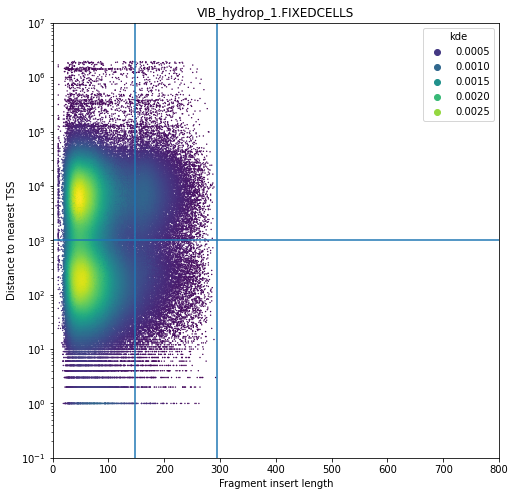

VIB_hydrop_2.FIXEDCELLS


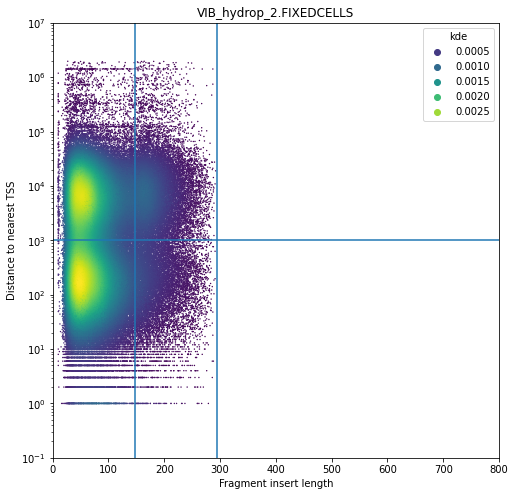

In [78]:
for sample, path in path_dict.items():
    print(sample)
    df = pd.read_csv(path, index_col=None, header=0, sep="\t")

    df["y"] = 10 ** np.array(df["y"])
    df["y"] = df["y"] - 1

    fig, ax = plt.subplots(figsize=(8, 8))
    sns.scatterplot(
        data=df, x="x", y="y", hue="kde", linewidth=0, s=2, ax=ax, palette="viridis"
    )

    # plt.xscale("log")
    ax.axhline(y=1000)
    ax.axvline(x=147)
    ax.axvline(x=294)

    plt.xlabel("Fragment insert length")
    plt.ylabel("Distance to nearest TSS")

    plt.xlim([0, 800])
    plt.ylim([0.1, 10**7])

    plt.yscale("log")
    plt.title(sample)
    plt.savefig(f"plots_qc/{sample}__fraglength_tss_dist.png", dpi=300)
    plt.show()
    plt.close()

# scatterplot

In [7]:
df_all_merged["y_abs"] = 10 ** df_all_merged["y"] - 1

In [8]:
df_all_merged

,x,y,kde,length,distance,quantile,sample,y_abs
0,532,5.952657,0.000002,multinucleosomal,distal,multinucleosomal_distal,BIO_ddseq_1.FIXEDCELLS,896720.0
1,507,5.790491,0.000002,multinucleosomal,distal,multinucleosomal_distal,BIO_ddseq_1.FIXEDCELLS,617291.0
2,495,6.194369,0.000002,multinucleosomal,distal,multinucleosomal_distal,BIO_ddseq_1.FIXEDCELLS,1564476.0
3,508,6.241463,0.000002,multinucleosomal,distal,multinucleosomal_distal,BIO_ddseq_1.FIXEDCELLS,1743665.0
4,471,6.152034,0.000002,multinucleosomal,distal,multinucleosomal_distal,BIO_ddseq_1.FIXEDCELLS,1419169.0
...,...,...,...,...,...,...,...,...
199995,48,2.230449,0.002908,nucleosome-free,proximal,nucleosome-free_proximal,VIB_hydrop_2.FIXEDCELLS,169.0
199996,47,2.209515,0.002910,nucleosome-free,proximal,nucleosome-free_proximal,VIB_hydrop_2.FIXEDCELLS,161.0
199997,47,2.252853,0.002910,nucleosome-free,proximal,nucleosome-free_proximal,VIB_hydrop_2.FIXEDCELLS,178.0
199998,46,2.247973,0.002910,nucleosome-free,proximal,nucleosome-free_proximal,VIB_hydrop_2.FIXEDCELLS,176.0


In [9]:
df_test = df_all_merged.groupby("sample").median()

/tmp/ipykernel_2004510/1378739698.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_test = df_all_merged.groupby("sample").median()


In [14]:
df_test["tech"] = [x.split("_")[1] for x in df_test.index]

<AxesSubplot: xlabel='x', ylabel='y'>

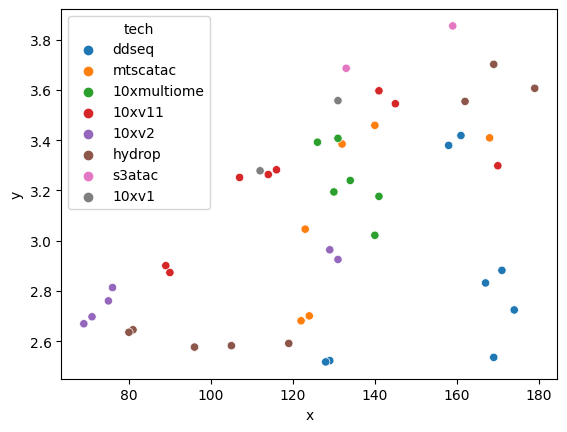

In [15]:
sns.scatterplot(df_test, x="x", y="y", hue="tech")

<AxesSubplot: xlabel='y', ylabel='x'>

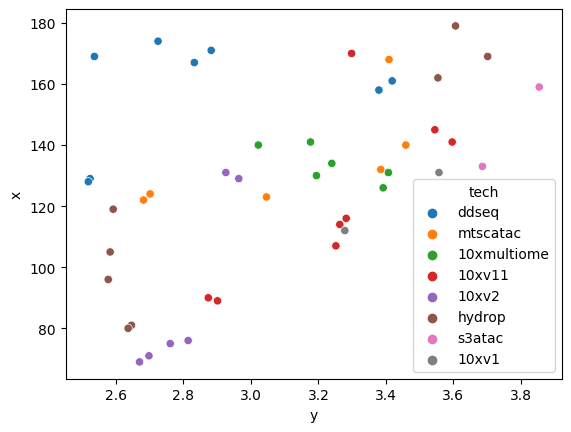

In [16]:
sns.scatterplot(df_test, x="y", y="x", hue="tech")

In [31]:
df_test.columns = [
    "median_frag_len",
    "median_log10_frag_dist_nearest_tss",
    "kde",
    "median_frag_dist_nearest_tss",
    "tech",
]

In [32]:
df_test[
    [
        "median_frag_len",
        "median_log10_frag_dist_nearest_tss",
        "median_frag_dist_nearest_tss",
    ]
].to_csv("median_frag_len_median_tss_dist.tsv", sep="\t", index=True, header=True)